# 03 — Raw QCL images to absorbance

This notebook walks through the complete image-processing path:

\[
I_{\mathrm{raw}}
\rightarrow I_{\mathrm{goldref}}
\rightarrow R
\rightarrow
\begin{cases}
R_{\mathrm{onMS}}\\
R_{\mathrm{outMS}}
\end{cases}
\rightarrow
\begin{cases}
R_{0,\mathrm{onMS}}\\
R_{0,\mathrm{outMS}}
\end{cases}
\rightarrow
\begin{cases}
A_{\mathrm{onMS}}\\
A_{\mathrm{outMS}}
\end{cases}
\]

The on-MS and out-MS regions are processed separately because they have different reflectance backgrounds.

The absorbance definition used here is:

\[
A=-\log_{10}\left(\frac{R}{R_0}\right)
\]

For each pattern and wavenumber, on-MS and out-MS use their own independently calculated \(R_0\).


## Setup

In [4]:
%matplotlib widget

from pathlib import Path
import math
import re

import ipywidgets as widgets
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from IPython.display import display
from matplotlib.patches import Rectangle
from matplotlib.widgets import RectangleSelector

from qcl_analysis.absorbance import calculate_absorbance, calculate_r0
from qcl_analysis.cropping import crop_ms_regions
from qcl_analysis.qc import (
    add_frame_quality_flags,
    add_reference_quality_flags,
)
from qcl_analysis.reflectance import (
    add_gold_reference_signals,
    load_reflectance_image,
)
from qcl_analysis.roi import ROI
from qcl_analysis.visualization import (
    BrightestPixelsViewer,
    MSRegionSelector,
    plot_gold_reference_trend,
)


### User settings

Set the path to the `stacks` folder and choose two patterns to inspect in detail.

The full dataset is still indexed so the `I_goldref` stability plot can include all pattern numbers.


In [5]:
# ===== User settings =====
stacks_dir = Path(
    "/Users/ethanjiang/Documents/Cornell/Research/DIY Incubator/Data/A431_04222026_QCL/2026-04-22_021/stacks"
)

patterns_to_show = [
    "pattern5",
    "pattern100",
]

expected_wavenumbers = [
    1600,
    1655,
    1750,
]

n_reference_pixels = 100

# Reference-quality thresholds
robust_z_threshold = 5.0
min_relative_deviation = 0.10

# Display percentiles only affect visualization, never the stored image values.
reflectance_display_percentiles = (1.0, 99.0)
absorbance_display_percentiles = (1.0, 99.0)


### Build the dataset index and quality-control table

This cell scans only folders named `pattern<number>` and CSV files named
`lineScan_<wavenumber>_0invcm.csv`.

For each raw image, `I_goldref` is calculated from the brightest pixels. Reference-quality flags are then added without deleting any frames.


In [6]:
PATTERN_REGEX = re.compile(r"^pattern(\d+)$")
WAVENUMBER_REGEX = re.compile(r"^lineScan_(\d+)_0invcm\.csv$")


def build_dataset_index(stacks_dir: Path) -> pd.DataFrame:
    """Index pattern folders and QCL CSV images."""

    records = []

    pattern_dirs = [
        path
        for path in stacks_dir.iterdir()
        if path.is_dir() and PATTERN_REGEX.match(path.name)
    ]

    pattern_dirs = sorted(
        pattern_dirs,
        key=lambda path: int(PATTERN_REGEX.match(path.name).group(1)),
    )

    for pattern_dir in pattern_dirs:
        frame = int(PATTERN_REGEX.match(pattern_dir.name).group(1))

        for path in sorted(pattern_dir.iterdir()):
            match = WAVENUMBER_REGEX.match(path.name)

            if not path.is_file() or match is None:
                continue

            records.append(
                {
                    "frame": frame,
                    "pattern": pattern_dir.name,
                    "wavenumber": int(match.group(1)),
                    "path": path,
                }
            )

    if not records:
        raise ValueError(f"No QCL CSV images were found in {stacks_dir}")

    return (
        pd.DataFrame(records)
        .sort_values(["frame", "wavenumber"])
        .reset_index(drop=True)
    )


dataset = build_dataset_index(stacks_dir)

reflectance_dataset = add_gold_reference_signals(
    dataset,
    n_pixels=n_reference_pixels,
)

qc_dataset = add_reference_quality_flags(
    reflectance_dataset,
    robust_z_threshold=robust_z_threshold,
    min_relative_deviation=min_relative_deviation,
)

qc_dataset = add_frame_quality_flags(
    qc_dataset,
    expected_wavenumbers=set(expected_wavenumbers),
)

print(f"Indexed images: {len(qc_dataset)}")
print(f"Frames: {qc_dataset['frame'].nunique()}")
print(f"Wavenumbers: {sorted(qc_dataset['wavenumber'].unique())}")

qc_dataset.head()


Indexed images: 521
Frames: 174
Wavenumbers: [np.int64(1600), np.int64(1655), np.int64(1750)]


,frame,pattern,wavenumber,path,i_goldref,gold_reference_n_pixels,reference_median,reference_mad,reference_relative_deviation,reference_robust_z,reference_valid,quality_reason,frame_valid,frame_quality_reason
0,0,pattern0,1600,/Users/ethanjiang/Documents/Cornell/Research/D...,6.782312,100,6.866285,0.031445,0.012230,-1.801195,True,good,False,reference_outlier
1,0,pattern0,1655,/Users/ethanjiang/Documents/Cornell/Research/D...,4.683966,100,4.898911,0.085080,0.043876,-1.704017,True,good,False,reference_outlier
2,0,pattern0,1750,/Users/ethanjiang/Documents/Cornell/Research/D...,8.570483,100,11.227101,0.060285,0.236626,-29.723032,False,low_reference,False,reference_outlier
3,1,pattern1,1600,/Users/ethanjiang/Documents/Cornell/Research/D...,6.794790,100,6.866285,0.031445,0.010412,-1.533551,True,good,True,good
4,1,pattern1,1655,/Users/ethanjiang/Documents/Cornell/Research/D...,4.703976,100,4.898911,0.085080,0.039791,-1.545384,True,good,True,good


# Section 1 — Raw MCT intensity

## 1.1 Raw images and gold-reference pixels

The selected raw MCT images are displayed for two patterns and all selected wavenumbers.

Red crosses mark the brightest pixels used to calculate the per-image gold-reference signal:

\[
I_{\mathrm{goldref}}=\mathrm{mean}(\text{brightest }N\text{ pixels})
\]


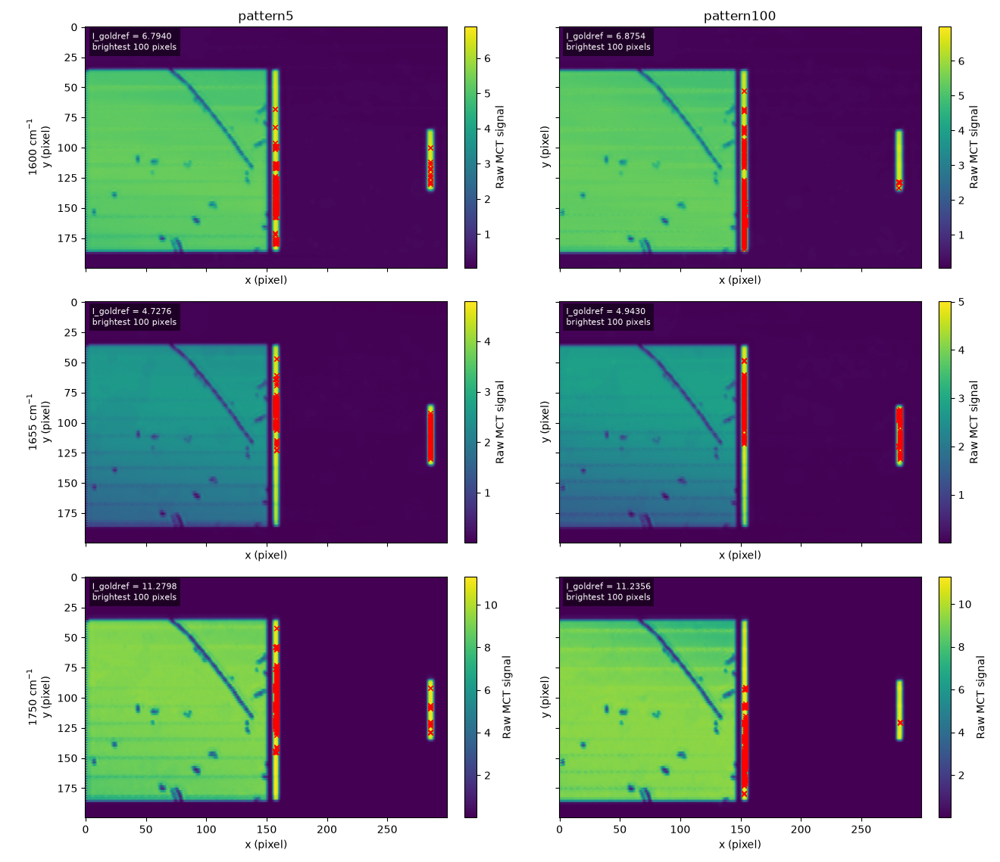

In [7]:
raw_viewer = BrightestPixelsViewer(
    qc_dataset,
    patterns=patterns_to_show,
    expected_wavenumbers=set(expected_wavenumbers),
    n_pixels=n_reference_pixels,
    show_colorbar=True,
)

raw_viewer.show()


## 1.2 Gold-reference stability over pattern number

Each wavenumber is plotted independently.

If `reference_valid == False`, the corresponding image is marked with a red hollow circle.


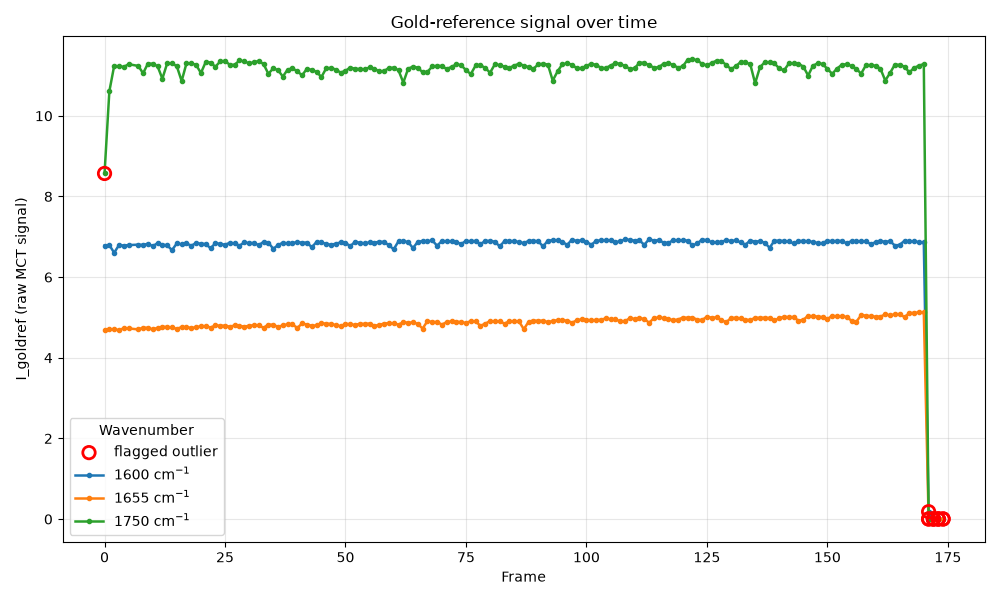

In [8]:
fig, ax = plot_gold_reference_trend(qc_dataset)
plt.show()


# Section 2 — Reflectance

Reflectance is calculated independently for every raw image:

\[
R(x,y)=\frac{I_{\mathrm{raw}}(x,y)}{I_{\mathrm{goldref}}}
\]

The full reflectance image is first inspected, then manually divided into an on-MS region and an out-MS region.


In [9]:
selected_reflectance_images = {}

for pattern in patterns_to_show:
    for wn in expected_wavenumbers:
        rows = qc_dataset[
            (qc_dataset["pattern"] == pattern)
            & (qc_dataset["wavenumber"] == wn)
        ]

        if rows.empty:
            raise ValueError(
                f"No image found for {pattern}, {wn} cm^-1."
            )

        selected_reflectance_images[(pattern, wn)] = load_reflectance_image(
            rows.iloc[0]
        )


In [10]:
def get_shared_display_limits(
    images: dict,
    patterns: list[str],
    wavenumber: int,
    percentiles: tuple[float, float],
) -> tuple[float | None, float | None]:
    """Return display limits shared across patterns for one wavenumber."""

    finite_parts = []

    for pattern in patterns:
        image = images[(pattern, wavenumber)]
        finite = image[np.isfinite(image)]

        if finite.size:
            finite_parts.append(finite)

    if not finite_parts:
        return None, None

    combined = np.concatenate(finite_parts)
    vmin, vmax = np.percentile(combined, percentiles)

    if vmin == vmax:
        vmax = vmin + np.finfo(float).eps

    return float(vmin), float(vmax)


def plot_image_grid(
    images: dict,
    patterns: list[str],
    wavenumbers: list[int],
    *,
    title: str,
    colorbar_label: str,
    display_percentiles: tuple[float, float] = (1.0, 99.0),
    cmap: str = "viridis",
):
    """Plot a pattern-by-wavenumber image grid.

    The same wavenumber uses the same display scale across patterns.
    Display limits do not modify the underlying image arrays.
    """

    n_rows = len(wavenumbers)
    n_cols = len(patterns)

    fig, axes = plt.subplots(
        n_rows,
        n_cols,
        figsize=(5.2 * n_cols, 4.0 * n_rows),
        squeeze=False,
    )

    for row_idx, wn in enumerate(wavenumbers):
        vmin, vmax = get_shared_display_limits(
            images,
            patterns,
            wn,
            display_percentiles,
        )

        for col_idx, pattern in enumerate(patterns):
            ax = axes[row_idx, col_idx]
            image = images[(pattern, wn)]

            im = ax.imshow(
                image,
                origin="upper",
                cmap=cmap,
                vmin=vmin,
                vmax=vmax,
            )

            ax.set_title(f"{pattern}, {wn} cm$^{{-1}}$")
            ax.set_xlabel("x (pixel)")
            ax.set_ylabel("y (pixel)")

            fig.colorbar(
                im,
                ax=ax,
                label=colorbar_label,
                fraction=0.035,
                pad=0.03,
                shrink=0.8,
            )

    fig.suptitle(title, fontsize=16)
    fig.tight_layout()
    plt.show()

    return fig, axes


## 2.1 Full reflectance images

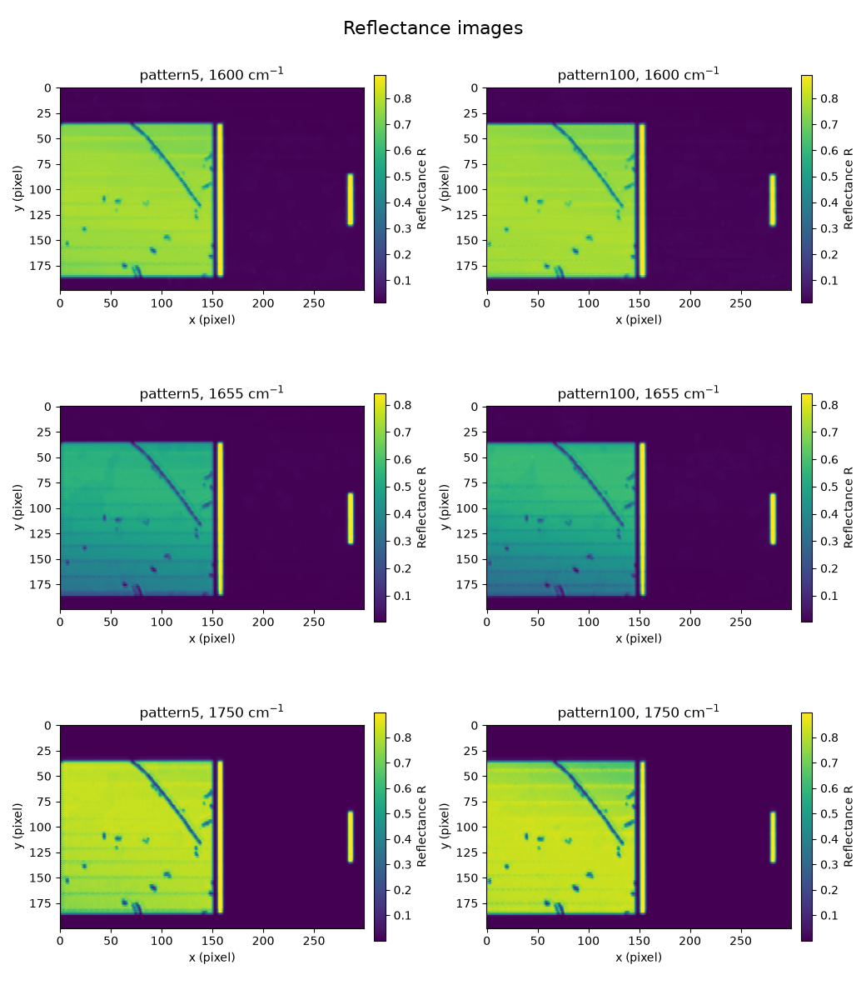

(<Figure size 1040x1200 with 12 Axes>,
 array([[<Axes: title={'center': 'pattern5, 1600 cm$^{-1}$'}, xlabel='x (pixel)', ylabel='y (pixel)'>,
         <Axes: title={'center': 'pattern100, 1600 cm$^{-1}$'}, xlabel='x (pixel)', ylabel='y (pixel)'>],
        [<Axes: title={'center': 'pattern5, 1655 cm$^{-1}$'}, xlabel='x (pixel)', ylabel='y (pixel)'>,
         <Axes: title={'center': 'pattern100, 1655 cm$^{-1}$'}, xlabel='x (pixel)', ylabel='y (pixel)'>],
        [<Axes: title={'center': 'pattern5, 1750 cm$^{-1}$'}, xlabel='x (pixel)', ylabel='y (pixel)'>,
         <Axes: title={'center': 'pattern100, 1750 cm$^{-1}$'}, xlabel='x (pixel)', ylabel='y (pixel)'>]],
       dtype=object))

In [11]:
plot_image_grid(
    selected_reflectance_images,
    patterns_to_show,
    expected_wavenumbers,
    title="Reflectance images",
    colorbar_label="Reflectance R",
    display_percentiles=reflectance_display_percentiles,
)


## 2.2 Select the on-MS and out-MS regions

Use the interactive selector to define two non-overlapping regions:

- `onMS`: the metasurface region
- `outMS`: the region outside the metasurface

The same crop coordinates are applied to both selected patterns and all selected wavenumbers.


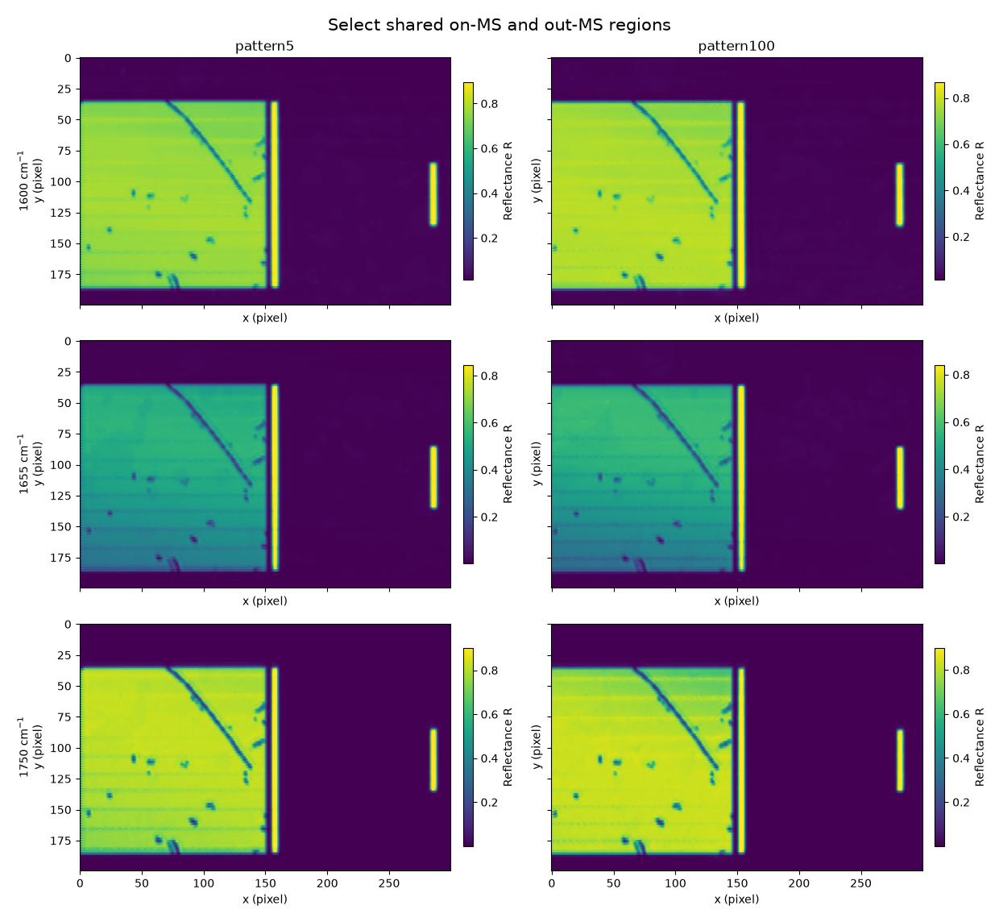

In [25]:
region_selector = MSRegionSelector(
    qc_dataset,
    patterns=patterns_to_show,
    expected_wavenumbers=set(expected_wavenumbers),
    contrast_percentiles=reflectance_display_percentiles,
)

region_selector.show()


After selecting both regions, click **Confirm Regions**, then run the next cell.

In [26]:
regions = region_selector.get_regions()

on_ms_roi = regions["onMS"]
out_ms_roi = regions["outMS"]

print("onMS ROI:", on_ms_roi)
print("outMS ROI:", out_ms_roi)


onMS ROI: ROI(x_min=2, x_max=62, y_min=38, y_max=101)
outMS ROI: ROI(x_min=165, x_max=278, y_min=1, y_max=198)


## 2.3 Crop and display the reflectance images separately

The reflectance arrays are cropped using the confirmed on-MS and out-MS ROIs.


In [27]:
on_ms_reflectance = {}
out_ms_reflectance = {}

for key, reflectance in selected_reflectance_images.items():
    on_ms, out_ms = crop_ms_regions(
        reflectance,
        on_ms_roi,
        out_ms_roi,
    )

    on_ms_reflectance[key] = on_ms
    out_ms_reflectance[key] = out_ms

example_key = (
    patterns_to_show[0],
    expected_wavenumbers[0],
)

print("Example full image shape:", selected_reflectance_images[example_key].shape)
print("Example onMS shape:", on_ms_reflectance[example_key].shape)
print("Example outMS shape:", out_ms_reflectance[example_key].shape)


Example full image shape: (200, 300)
Example onMS shape: (63, 60)
Example outMS shape: (197, 113)


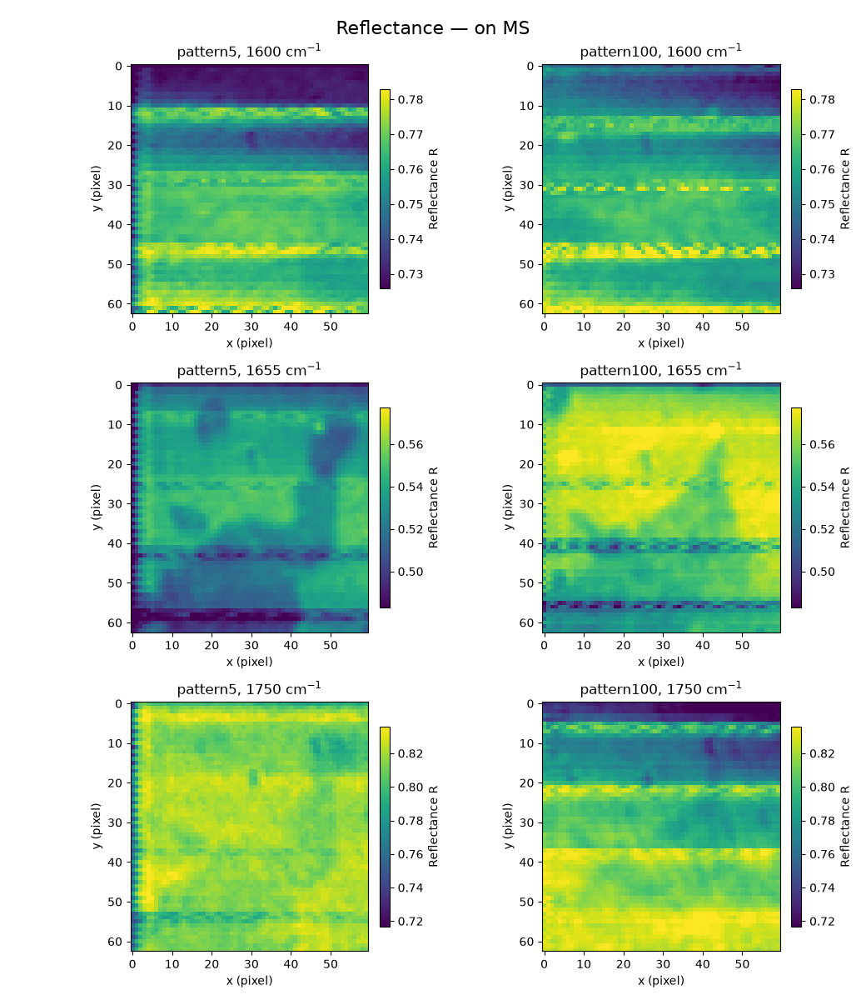

(<Figure size 1040x1200 with 12 Axes>,
 array([[<Axes: title={'center': 'pattern5, 1600 cm$^{-1}$'}, xlabel='x (pixel)', ylabel='y (pixel)'>,
         <Axes: title={'center': 'pattern100, 1600 cm$^{-1}$'}, xlabel='x (pixel)', ylabel='y (pixel)'>],
        [<Axes: title={'center': 'pattern5, 1655 cm$^{-1}$'}, xlabel='x (pixel)', ylabel='y (pixel)'>,
         <Axes: title={'center': 'pattern100, 1655 cm$^{-1}$'}, xlabel='x (pixel)', ylabel='y (pixel)'>],
        [<Axes: title={'center': 'pattern5, 1750 cm$^{-1}$'}, xlabel='x (pixel)', ylabel='y (pixel)'>,
         <Axes: title={'center': 'pattern100, 1750 cm$^{-1}$'}, xlabel='x (pixel)', ylabel='y (pixel)'>]],
       dtype=object))

In [30]:
plot_image_grid(
    on_ms_reflectance,
    patterns_to_show,
    expected_wavenumbers,
    title="Reflectance — on MS",
    colorbar_label="Reflectance R",
    display_percentiles=reflectance_display_percentiles,
)


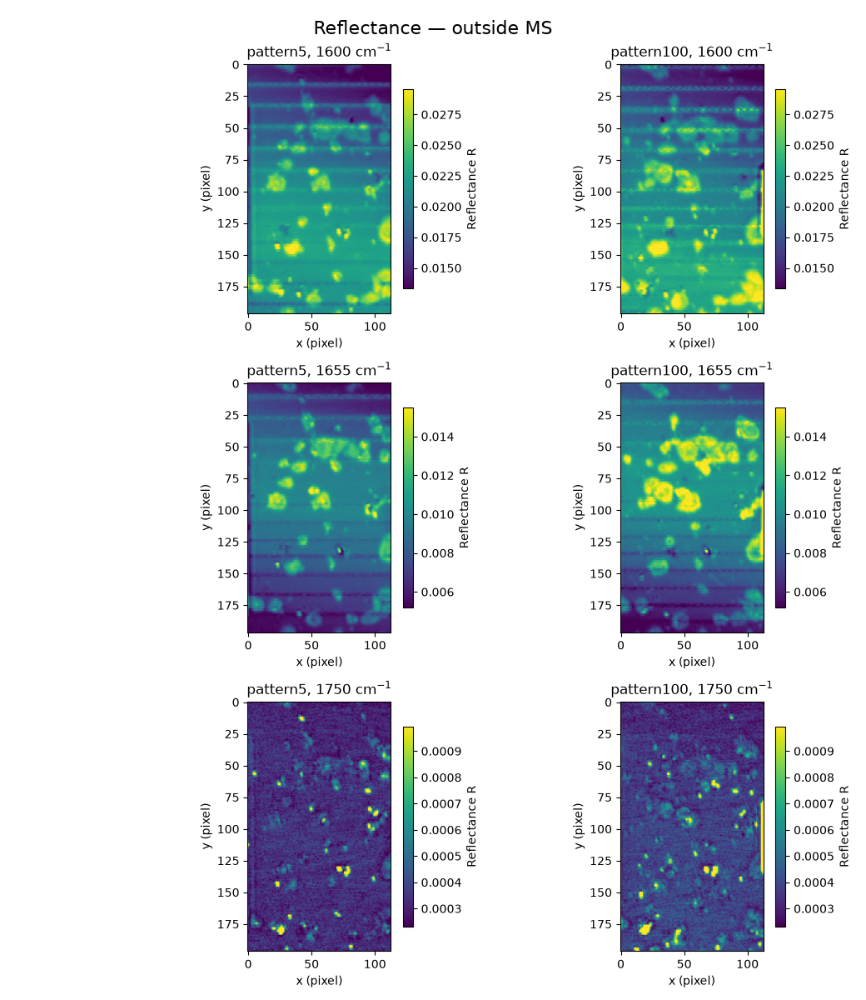

(<Figure size 1040x1200 with 12 Axes>,
 array([[<Axes: title={'center': 'pattern5, 1600 cm$^{-1}$'}, xlabel='x (pixel)', ylabel='y (pixel)'>,
         <Axes: title={'center': 'pattern100, 1600 cm$^{-1}$'}, xlabel='x (pixel)', ylabel='y (pixel)'>],
        [<Axes: title={'center': 'pattern5, 1655 cm$^{-1}$'}, xlabel='x (pixel)', ylabel='y (pixel)'>,
         <Axes: title={'center': 'pattern100, 1655 cm$^{-1}$'}, xlabel='x (pixel)', ylabel='y (pixel)'>],
        [<Axes: title={'center': 'pattern5, 1750 cm$^{-1}$'}, xlabel='x (pixel)', ylabel='y (pixel)'>,
         <Axes: title={'center': 'pattern100, 1750 cm$^{-1}$'}, xlabel='x (pixel)', ylabel='y (pixel)'>]],
       dtype=object))

In [31]:
plot_image_grid(
    out_ms_reflectance,
    patterns_to_show,
    expected_wavenumbers,
    title="Reflectance — outside MS",
    colorbar_label="Reflectance R",
    display_percentiles=reflectance_display_percentiles,
)


## 2.4 Interactive cell-free reference selection

The helper below selects a cell-free ROI from already-cropped reflectance images.

A contrast percentile slider is provided only to improve visibility during ROI selection.

**Important:** changing the contrast slider only changes `imshow` display limits. It never changes the stored reflectance arrays. Therefore, every \(R_0\) is calculated from the original reflectance values, not from contrast-enhanced data.


In [33]:
class CroppedReferenceSelector:
    """Select one shared cell-free ROI from cropped reflectance images.

    Contrast controls modify display limits only. R0 is always calculated
    from the original reflectance arrays stored in this object.
    """

    def __init__(
        self,
        images: dict[tuple[str, int], np.ndarray],
        *,
        patterns: list[str],
        wavenumbers: list[int],
        title: str,
        contrast_percentiles: tuple[float, float] = (1.0, 99.0),
        cmap: str = "viridis",
    ):
        self.images = {
            key: np.asarray(image, dtype=float).copy()
            for key, image in images.items()
        }

        self.patterns = list(patterns)
        self.wavenumbers = [int(wn) for wn in wavenumbers]
        self.title = title
        self.cmap = cmap

        low, high = contrast_percentiles

        if not 0 <= low < high <= 100:
            raise ValueError(
                "contrast_percentiles must satisfy 0 <= low < high <= 100."
            )

        self.contrast_percentiles = (
            float(low),
            float(high),
        )

        expected_keys = {
            (pattern, wn)
            for pattern in self.patterns
            for wn in self.wavenumbers
        }

        missing_keys = expected_keys - set(self.images)

        if missing_keys:
            raise ValueError(
                f"Missing cropped images: {sorted(missing_keys)}"
            )

        shapes = {
            self.images[key].shape
            for key in expected_keys
        }

        if len(shapes) != 1:
            raise ValueError(
                "All images displayed by one selector must have the same shape."
            )

        self.image_shape = next(iter(shapes))

        self.roi = None
        self.confirmed_roi = None

        self.figure = None
        self.axes = None

        self._image_artists = {}
        self._patches = []
        self._selectors = []

        self._mode = "idle"
        self._full_xlim = None
        self._full_ylim = None

        self._controls = None
        self._status = None
        self._contrast_slider = None
        self._click_connection = None

    @staticmethod
    def _contrast_limits(
        image: np.ndarray,
        low: float,
        high: float,
    ) -> tuple[float, float]:
        finite = image[np.isfinite(image)]

        if finite.size == 0:
            return 0.0, 1.0

        vmin, vmax = np.percentile(
            finite,
            [low, high],
        )

        if vmin == vmax:
            vmax = vmin + np.finfo(float).eps

        return float(vmin), float(vmax)

    @staticmethod
    def _bounded_limits(
        *,
        center: float,
        current_limits: tuple[float, float],
        full_limits: tuple[float, float],
        factor: float,
    ) -> tuple[float, float]:
        current_start, current_end = current_limits
        full_start, full_end = full_limits

        reversed_axis = current_start > current_end

        current_low = min(current_start, current_end)
        current_high = max(current_start, current_end)
        full_low = min(full_start, full_end)
        full_high = max(full_start, full_end)

        full_span = full_high - full_low
        current_span = current_high - current_low
        new_span = min(
            current_span * factor,
            full_span,
        )

        center = min(
            max(center, full_low),
            full_high,
        )

        new_low = center - new_span / 2
        new_high = center + new_span / 2

        if new_low < full_low:
            shift = full_low - new_low
            new_low += shift
            new_high += shift

        if new_high > full_high:
            shift = new_high - full_high
            new_low -= shift
            new_high -= shift

        if reversed_axis:
            return new_high, new_low

        return new_low, new_high

    def _set_status(self, message: str):
        if self._status is not None:
            self._status.value = message

    def _set_selectors_active(self, active: bool):
        for selector in self._selectors:
            selector.set_active(active)
            selector.set_visible(active)

    def _update_status(self):
        if self.roi is None:
            self._set_status(
                "No cell-free R0 ROI selected."
            )
            return

        prefix = (
            "R0 ROI confirmed"
            if self.confirmed_roi is not None
            else "R0 ROI selected"
        )

        self._set_status(
            f"{prefix}: "
            f"x=[{self.roi.x_min}, {self.roi.x_max}), "
            f"y=[{self.roi.y_min}, {self.roi.y_max})"
        )

    def _set_mode(self, mode: str):
        self._mode = mode

        if mode == "select":
            self._set_selectors_active(True)
            self._set_status(
                "ROI selection mode: drag a cell-free region on any image."
            )
        elif mode == "zoom_in":
            self._set_selectors_active(False)
            self._set_status(
                "Zoom In mode: click a point on any image."
            )
        elif mode == "zoom_out":
            self._set_selectors_active(False)
            self._set_status(
                "Zoom Out mode: click a point on any image."
            )
        else:
            self._set_selectors_active(False)
            self._update_status()

    def _on_select(self, eclick, erelease):
        if self._mode != "select":
            return

        if (
            eclick.xdata is None
            or eclick.ydata is None
            or erelease.xdata is None
            or erelease.ydata is None
        ):
            return

        height, width = self.image_shape

        x_min = max(
            0,
            math.floor(
                min(eclick.xdata, erelease.xdata)
            ),
        )
        x_max = min(
            width,
            math.ceil(
                max(eclick.xdata, erelease.xdata)
            ),
        )

        y_min = max(
            0,
            math.floor(
                min(eclick.ydata, erelease.ydata)
            ),
        )
        y_max = min(
            height,
            math.ceil(
                max(eclick.ydata, erelease.ydata)
            ),
        )

        if x_min >= x_max or y_min >= y_max:
            self._set_status(
                "Invalid ROI. Select a larger region."
            )
            return

        self.roi = ROI(
            x_min=x_min,
            x_max=x_max,
            y_min=y_min,
            y_max=y_max,
        )

        self.confirmed_roi = None

        self._update_patches()
        self._set_mode("idle")

    def _update_patches(self):
        if self.roi is None:
            for patch in self._patches:
                patch.set_visible(False)

            if self.figure is not None:
                self.figure.canvas.draw_idle()

            return

        width = self.roi.x_max - self.roi.x_min
        height = self.roi.y_max - self.roi.y_min

        for patch in self._patches:
            patch.set_xy(
                (
                    self.roi.x_min - 0.5,
                    self.roi.y_min - 0.5,
                )
            )
            patch.set_width(width)
            patch.set_height(height)
            patch.set_visible(True)

        if self.figure is not None:
            self.figure.canvas.draw_idle()

    def _select_clicked(self, _):
        self.confirmed_roi = None
        self._set_mode("select")

    def _clear_clicked(self, _):
        self.roi = None
        self.confirmed_roi = None

        self._set_selectors_active(False)
        self._update_patches()
        self._set_mode("idle")

    def _confirm_clicked(self, _):
        if self.roi is None:
            self._set_status(
                "Select a cell-free R0 ROI before confirming."
            )
            return

        self.confirmed_roi = self.roi
        self._set_mode("idle")

    def _zoom_in_clicked(self, _):
        self._set_mode("zoom_in")

    def _zoom_out_clicked(self, _):
        self._set_mode("zoom_out")

    def _reset_clicked(self, _):
        if self.axes is None:
            return

        first_ax = self.axes.flat[0]
        first_ax.set_xlim(self._full_xlim)
        first_ax.set_ylim(self._full_ylim)

        self.figure.canvas.draw_idle()
        self._set_mode("idle")

    def _on_image_click(self, event):
        if (
            self._mode not in {"zoom_in", "zoom_out"}
            or event.inaxes is None
            or event.xdata is None
            or event.ydata is None
        ):
            return

        if event.inaxes not in self.axes.flat:
            return

        factor = (
            0.5
            if self._mode == "zoom_in"
            else 2.0
        )

        new_xlim = self._bounded_limits(
            center=event.xdata,
            current_limits=event.inaxes.get_xlim(),
            full_limits=self._full_xlim,
            factor=factor,
        )

        new_ylim = self._bounded_limits(
            center=event.ydata,
            current_limits=event.inaxes.get_ylim(),
            full_limits=self._full_ylim,
            factor=factor,
        )

        event.inaxes.set_xlim(new_xlim)
        event.inaxes.set_ylim(new_ylim)

        self.figure.canvas.draw_idle()
        self._set_mode("idle")

    def _on_contrast_change(self, change):
        low, high = change["new"]

        if low >= high:
            return

        # Only the displayed color limits are changed here.
        # The reflectance arrays in self.images are never modified.
        for key, image in self.images.items():
            vmin, vmax = self._contrast_limits(
                image,
                low,
                high,
            )

            self._image_artists[key].set_clim(
                vmin,
                vmax,
            )

        if self.figure is not None:
            self.figure.canvas.draw_idle()

    def _build_controls(self):
        zoom_in_button = widgets.Button(
            description="Zoom In"
        )
        zoom_out_button = widgets.Button(
            description="Zoom Out"
        )
        reset_button = widgets.Button(
            description="Reset View"
        )

        select_button = widgets.Button(
            description="Select R0 ROI"
        )
        clear_button = widgets.Button(
            description="Clear ROI"
        )
        confirm_button = widgets.Button(
            description="Confirm R0 ROI",
            button_style="success",
        )

        zoom_in_button.on_click(
            self._zoom_in_clicked
        )
        zoom_out_button.on_click(
            self._zoom_out_clicked
        )
        reset_button.on_click(
            self._reset_clicked
        )

        select_button.on_click(
            self._select_clicked
        )
        clear_button.on_click(
            self._clear_clicked
        )
        confirm_button.on_click(
            self._confirm_clicked
        )

        self._contrast_slider = widgets.FloatRangeSlider(
            value=self.contrast_percentiles,
            min=0.0,
            max=100.0,
            step=0.5,
            description="Contrast",
            continuous_update=True,
            readout_format=".1f",
            layout=widgets.Layout(
                width="520px"
            ),
        )

        self._contrast_slider.observe(
            self._on_contrast_change,
            names="value",
        )

        self._status = widgets.Label(
            value="No cell-free R0 ROI selected."
        )

        self._controls = widgets.VBox(
            [
                widgets.HBox(
                    [
                        zoom_in_button,
                        zoom_out_button,
                        reset_button,
                    ]
                ),
                widgets.HBox(
                    [
                        select_button,
                        clear_button,
                        confirm_button,
                    ]
                ),
                self._contrast_slider,
                self._status,
            ]
        )

    def show(self):
        n_rows = len(self.wavenumbers)
        n_cols = len(self.patterns)

        if self.figure is not None:
            plt.close(self.figure)

        with plt.ioff():
            self.figure, self.axes = plt.subplots(
                n_rows,
                n_cols,
                figsize=(
                    6.2 * n_cols,
                    3.8 * n_rows,
                ),
                squeeze=False,
                sharex=True,
                sharey=True,
            )

        self._image_artists = {}
        self._patches = []
        self._selectors = []

        low, high = self.contrast_percentiles

        for row_idx, wn in enumerate(
            self.wavenumbers
        ):
            for col_idx, pattern in enumerate(
                self.patterns
            ):
                ax = self.axes[
                    row_idx,
                    col_idx,
                ]

                key = (
                    pattern,
                    wn,
                )

                image = self.images[key]

                vmin, vmax = self._contrast_limits(
                    image,
                    low,
                    high,
                )

                im = ax.imshow(
                    image,
                    origin="upper",
                    cmap=self.cmap,
                    vmin=vmin,
                    vmax=vmax,
                )

                self._image_artists[
                    key
                ] = im

                if row_idx == 0:
                    ax.set_title(
                        pattern
                    )

                ax.set_xlabel(
                    "x (cropped pixel)"
                )

                if col_idx == 0:
                    ax.set_ylabel(
                        f"{wn} cm$^{{-1}}$\n"
                        "y (cropped pixel)"
                    )
                else:
                    ax.set_ylabel(
                        "y (cropped pixel)"
                    )

                self.figure.colorbar(
                    im,
                    ax=ax,
                    label="Reflectance R",
                    fraction=0.035,
                    pad=0.03,
                    shrink=0.8,
                )

                patch = Rectangle(
                    (0, 0),
                    0,
                    0,
                    fill=False,
                    edgecolor="red",
                    linewidth=2.0,
                    linestyle="--",
                    visible=False,
                )

                ax.add_patch(
                    patch
                )
                self._patches.append(
                    patch
                )

                selector = RectangleSelector(
                    ax,
                    self._on_select,
                    useblit=True,
                    button=[1],
                    minspanx=1,
                    minspany=1,
                    spancoords="data",
                    interactive=False,
                )

                selector.set_active(
                    False
                )
                selector.set_visible(
                    False
                )

                self._selectors.append(
                    selector
                )

        height, width = self.image_shape

        self._full_xlim = (
            -0.5,
            width - 0.5,
        )
        self._full_ylim = (
            height - 0.5,
            -0.5,
        )

        first_ax = self.axes.flat[0]
        first_ax.set_xlim(
            self._full_xlim
        )
        first_ax.set_ylim(
            self._full_ylim
        )

        if self._click_connection is not None:
            self.figure.canvas.mpl_disconnect(
                self._click_connection
            )

        self._click_connection = (
            self.figure.canvas.mpl_connect(
                "button_press_event",
                self._on_image_click,
            )
        )

        self._build_controls()
        self._update_patches()

        self.figure.suptitle(
            self.title,
            fontsize=15,
        )
        self.figure.tight_layout()

        display(
            self._controls
        )
        display(
            self.figure.canvas
        )

    def get_roi(self) -> ROI:
        if self.confirmed_roi is None:
            raise RuntimeError(
                "The R0 ROI must be confirmed first."
            )

        return self.confirmed_roi

    def get_r0_summary(self) -> pd.DataFrame:
        """Calculate R0 from the original, unmodified reflectance arrays."""

        roi = self.get_roi()
        records = []

        for pattern in self.patterns:
            for wn in self.wavenumbers:
                image = self.images[
                    (
                        pattern,
                        wn,
                    )
                ]

                r0 = calculate_r0(
                    image,
                    roi,
                )

                records.append(
                    {
                        "pattern": pattern,
                        "wavenumber": wn,
                        "r0": r0,
                        "roi_x_min": roi.x_min,
                        "roi_x_max": roi.x_max,
                        "roi_y_min": roi.y_min,
                        "roi_y_max": roi.y_max,
                    }
                )

        return pd.DataFrame(
            records
        )


### Select the cell-free on-MS reference region

Use the contrast slider as needed, then select and confirm a cell-free region that is suitable across both displayed patterns and all selected wavenumbers.


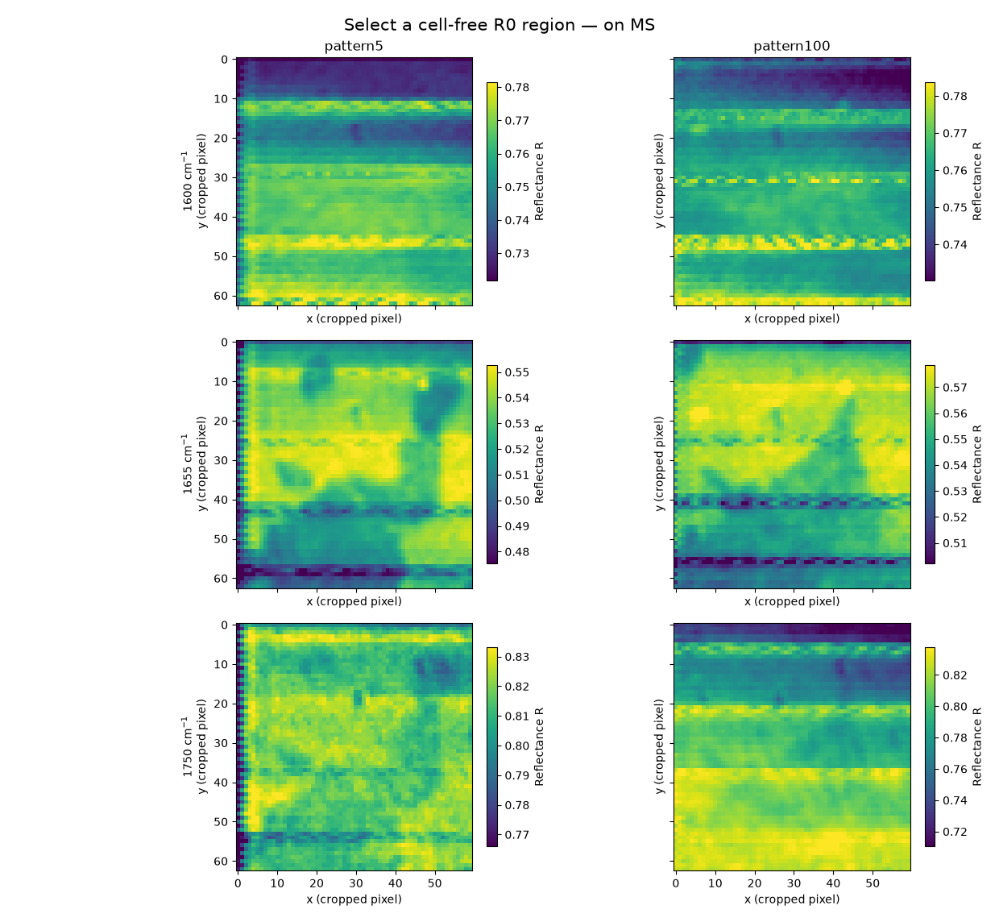

In [34]:
on_ms_r0_selector = CroppedReferenceSelector(
    on_ms_reflectance,
    patterns=patterns_to_show,
    wavenumbers=expected_wavenumbers,
    title="Select a cell-free R0 region — on MS",
    contrast_percentiles=reflectance_display_percentiles,
)

on_ms_r0_selector.show()


### Select the cell-free out-MS reference region

This ROI is independent of the on-MS reference ROI.


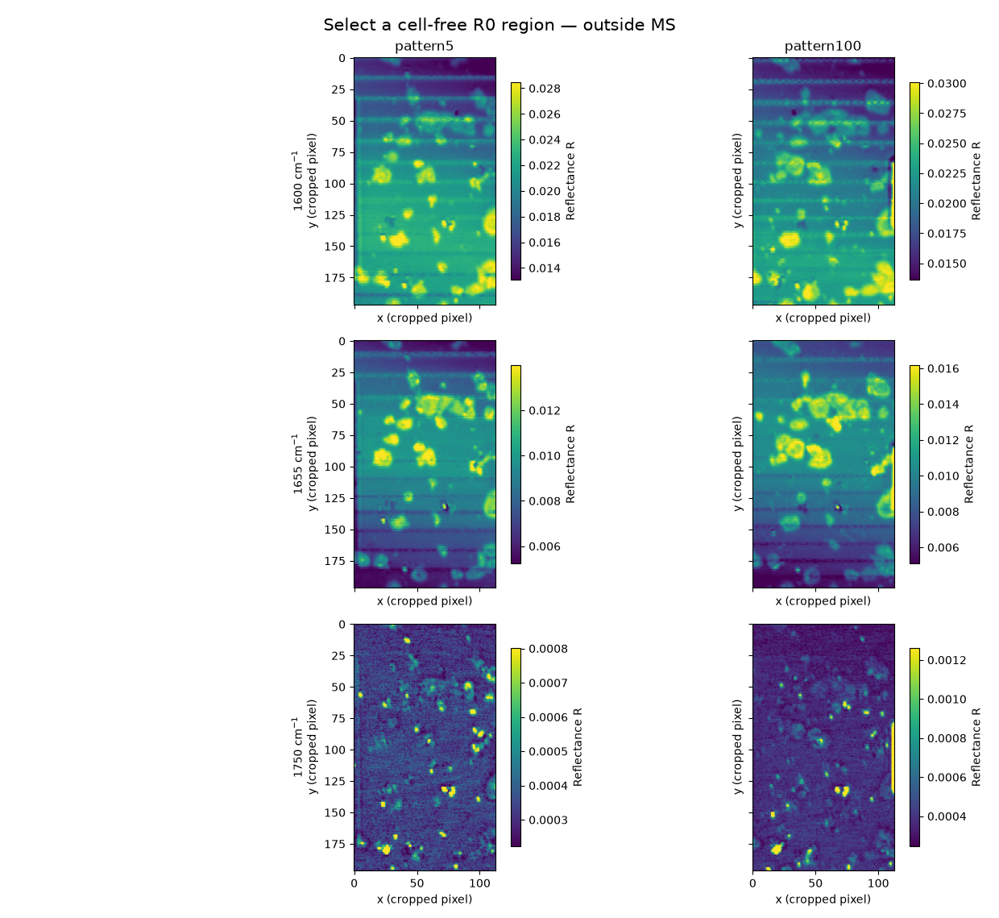

In [35]:
out_ms_r0_selector = CroppedReferenceSelector(
    out_ms_reflectance,
    patterns=patterns_to_show,
    wavenumbers=expected_wavenumbers,
    title="Select a cell-free R0 region — outside MS",
    contrast_percentiles=reflectance_display_percentiles,
)

out_ms_r0_selector.show()


After confirming both cell-free regions, calculate the separate on-MS and out-MS \(R_0\) values.

Each pattern and each wavenumber receives its own \(R_0\).


In [36]:
on_ms_r0_roi = on_ms_r0_selector.get_roi()
out_ms_r0_roi = out_ms_r0_selector.get_roi()

on_ms_r0_summary = on_ms_r0_selector.get_r0_summary()
out_ms_r0_summary = out_ms_r0_selector.get_r0_summary()

print("onMS cell-free ROI:", on_ms_r0_roi)
display(on_ms_r0_summary)

print("outMS cell-free ROI:", out_ms_r0_roi)
display(out_ms_r0_summary)


onMS cell-free ROI: ROI(x_min=3, x_max=8, y_min=28, y_max=39)


,pattern,wavenumber,r0,roi_x_min,roi_x_max,roi_y_min,roi_y_max
0,pattern5,1600,0.766836,3,8,28,39
1,pattern5,1655,0.547935,3,8,28,39
2,pattern5,1750,0.818408,3,8,28,39
3,pattern100,1600,0.763793,3,8,28,39
4,pattern100,1655,0.564966,3,8,28,39
5,pattern100,1750,0.812841,3,8,28,39


outMS cell-free ROI: ROI(x_min=13, x_max=22, y_min=114, y_max=125)


,pattern,wavenumber,r0,roi_x_min,roi_x_max,roi_y_min,roi_y_max
0,pattern5,1600,0.022547,13,22,114,125
1,pattern5,1655,0.008913,13,22,114,125
2,pattern5,1750,0.000347,13,22,114,125
3,pattern100,1600,0.022298,13,22,114,125
4,pattern100,1655,0.009385,13,22,114,125
5,pattern100,1750,0.000420,13,22,114,125


# Section 3 — Absorbance

The two spatial regions are normalized independently.

For the metasurface region:

$$
A_{\mathrm{onMS}}
=
-\log_{10}
\left(
\frac{R_{\mathrm{onMS}}}
{R_{0,\mathrm{onMS}}}
\right)
$$

For the region outside the metasurface:

$$
A_{\mathrm{outMS}}
=
-\log_{10}
\left(
\frac{R_{\mathrm{outMS}}}
{R_{0,\mathrm{outMS}}}
\right)
$$

The $R_0$ values are calculated from the original reflectance arrays inside the manually selected cell-free ROIs.

In [37]:
def summary_to_lookup(
    summary: pd.DataFrame,
) -> dict[tuple[str, int], float]:
    """Convert an R0 summary table into a lookup dictionary."""

    return {
        (
            row["pattern"],
            int(row["wavenumber"]),
        ): float(row["r0"])
        for _, row in summary.iterrows()
    }


on_ms_r0_lookup = summary_to_lookup(
    on_ms_r0_summary
)

out_ms_r0_lookup = summary_to_lookup(
    out_ms_r0_summary
)

absorbance_on_ms = {}
absorbance_out_ms = {}

for key, reflectance in on_ms_reflectance.items():
    absorbance_on_ms[key] = calculate_absorbance(
        reflectance,
        on_ms_r0_lookup[key],
    )

for key, reflectance in out_ms_reflectance.items():
    absorbance_out_ms[key] = calculate_absorbance(
        reflectance,
        out_ms_r0_lookup[key],
    )


## 3.1 Absorbance images — on MS

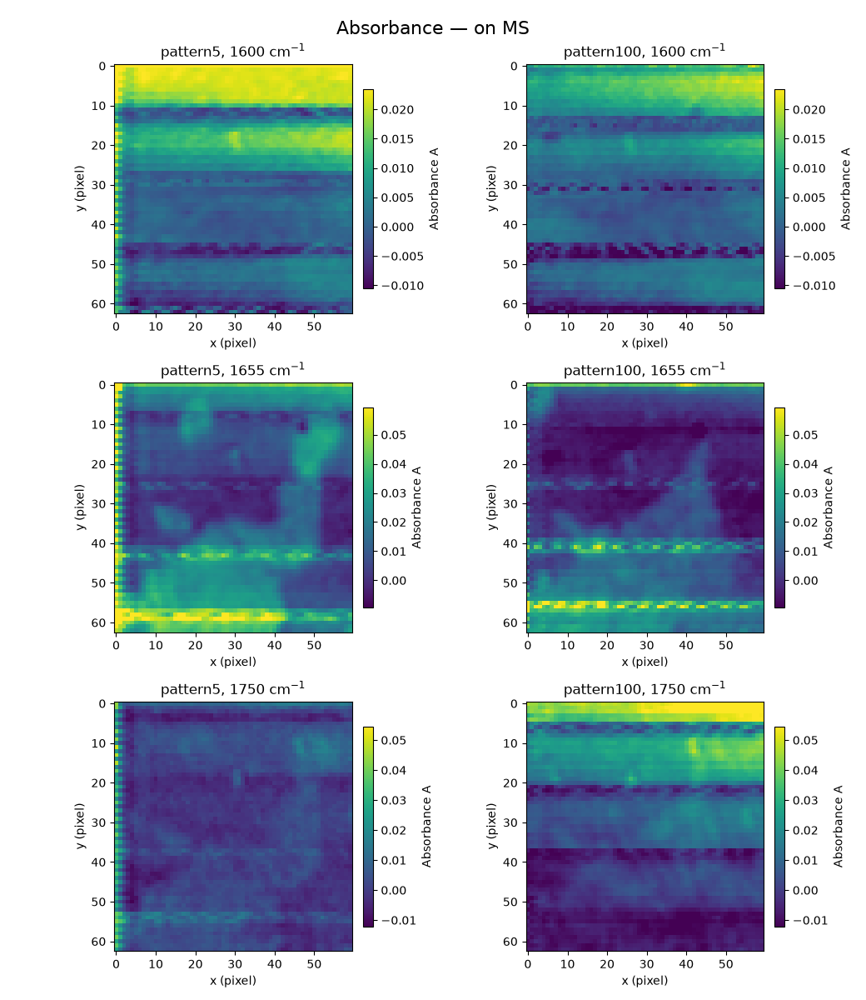

(<Figure size 1040x1200 with 12 Axes>,
 array([[<Axes: title={'center': 'pattern5, 1600 cm$^{-1}$'}, xlabel='x (pixel)', ylabel='y (pixel)'>,
         <Axes: title={'center': 'pattern100, 1600 cm$^{-1}$'}, xlabel='x (pixel)', ylabel='y (pixel)'>],
        [<Axes: title={'center': 'pattern5, 1655 cm$^{-1}$'}, xlabel='x (pixel)', ylabel='y (pixel)'>,
         <Axes: title={'center': 'pattern100, 1655 cm$^{-1}$'}, xlabel='x (pixel)', ylabel='y (pixel)'>],
        [<Axes: title={'center': 'pattern5, 1750 cm$^{-1}$'}, xlabel='x (pixel)', ylabel='y (pixel)'>,
         <Axes: title={'center': 'pattern100, 1750 cm$^{-1}$'}, xlabel='x (pixel)', ylabel='y (pixel)'>]],
       dtype=object))

In [39]:
plot_image_grid(
    absorbance_on_ms,
    patterns_to_show,
    expected_wavenumbers,
    title="Absorbance — on MS",
    colorbar_label="Absorbance A",
    display_percentiles=absorbance_display_percentiles,
)


## 3.2 Absorbance images — outside MS

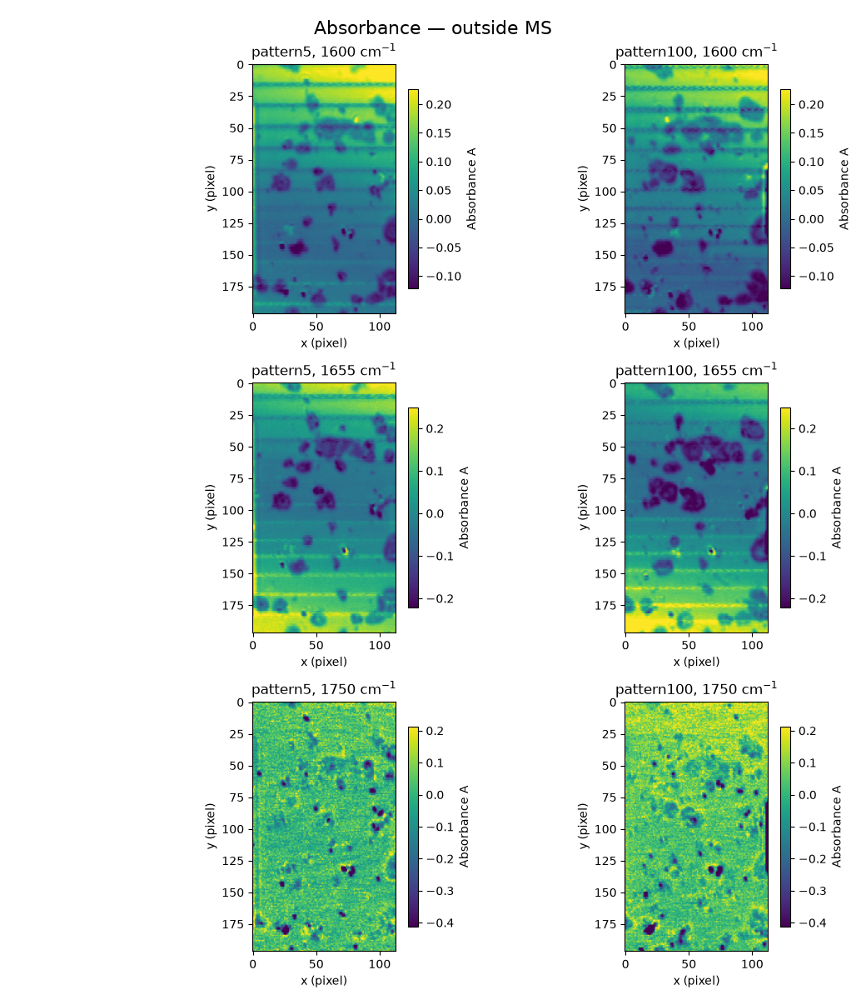

(<Figure size 1040x1200 with 12 Axes>,
 array([[<Axes: title={'center': 'pattern5, 1600 cm$^{-1}$'}, xlabel='x (pixel)', ylabel='y (pixel)'>,
         <Axes: title={'center': 'pattern100, 1600 cm$^{-1}$'}, xlabel='x (pixel)', ylabel='y (pixel)'>],
        [<Axes: title={'center': 'pattern5, 1655 cm$^{-1}$'}, xlabel='x (pixel)', ylabel='y (pixel)'>,
         <Axes: title={'center': 'pattern100, 1655 cm$^{-1}$'}, xlabel='x (pixel)', ylabel='y (pixel)'>],
        [<Axes: title={'center': 'pattern5, 1750 cm$^{-1}$'}, xlabel='x (pixel)', ylabel='y (pixel)'>,
         <Axes: title={'center': 'pattern100, 1750 cm$^{-1}$'}, xlabel='x (pixel)', ylabel='y (pixel)'>]],
       dtype=object))

In [40]:
plot_image_grid(
    absorbance_out_ms,
    patterns_to_show,
    expected_wavenumbers,
    title="Absorbance — outside MS",
    colorbar_label="Absorbance A",
    display_percentiles=absorbance_display_percentiles,
)


## 3.3 Reference-region sanity check

Because \(R_0\) is the mean reflectance inside each selected reference ROI, the mean absorbance in that ROI should be close to zero.

This check is performed separately for on-MS and out-MS.


In [42]:
def reference_absorbance_check(
    absorbance_images: dict,
    roi: ROI,
    patterns: list[str],
    wavenumbers: list[int],
) -> pd.DataFrame:
    records = []

    for pattern in patterns:
        for wn in wavenumbers:
            image = absorbance_images[
                (
                    pattern,
                    wn,
                )
            ]

            roi_values = image[
                roi.as_slices()
            ]

            records.append(
                {
                    "pattern": pattern,
                    "wavenumber": wn,
                    "mean_absorbance_in_R0_ROI": float(
                        np.nanmean(
                            roi_values
                        )
                    ),
                }
            )

    return pd.DataFrame(
        records
    )


print(
    "onMS reference-region absorbance:"
)
display(
    reference_absorbance_check(
        absorbance_on_ms,
        on_ms_r0_roi,
        patterns_to_show,
        expected_wavenumbers,
    )
)

print(
    "outMS reference-region absorbance:"
)
display(
    reference_absorbance_check(
        absorbance_out_ms,
        out_ms_r0_roi,
        patterns_to_show,
        expected_wavenumbers,
    )
)


onMS reference-region absorbance:


,pattern,wavenumber,mean_absorbance_in_R0_ROI
0,pattern5,1600,0.000002
1,pattern5,1655,0.000006
2,pattern5,1750,0.000008
3,pattern100,1600,0.000006
4,pattern100,1655,0.000009
5,pattern100,1750,0.000033


outMS reference-region absorbance:


,pattern,wavenumber,mean_absorbance_in_R0_ROI
0,pattern5,1600,0.000018
1,pattern5,1655,0.000437
2,pattern5,1750,0.003072
3,pattern100,1600,0.000730
4,pattern100,1655,0.000344
5,pattern100,1750,0.013760
